## Project - AllLife Bank Unsupervised Learning

### Description

### Context:
AllLife Bank wants to focus on its credit card customer base in the next financial year. They have been advised by their marketing research team, that the penetration in the market can be improved. Based on this input, the Marketing team proposes to run personalised campaigns to target new customers as well as upsell to existing customers. Another insight from the market research was that the customers perceive the support services of the back poorly. Based on this, the Operations team wants to upgrade the service delivery model, to ensure that customers queries are resolved faster. Head of Marketing and Head of Delivery both decide to reach out to the Data Science team for help
Objective: To identify different segments in the existing customer based on their spending patterns as well as past interaction with the bank.

### Dataset:  ALLLife bank
Data Description: Data is of various customers of a bank with their credit limit, the total number of credit cards the customer has, and different channels through which customer has contacted the bank for any queries, different channels include visiting the bank, online and through a call centre.

Apply the concepts and techniques you have learned in the previous weeks and summarize your insights at the end.

### Key Questions:

1. Perform EDA.
2. Apply Clustering Algorithms and mentions how many clusters are formed ?
3. How are these segments different from each other?
4. What are your recommendations to the bank on how to better market to and service these customers?

In [70]:
# import libraries
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import pylab as pl
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns

# Machine learning libaries
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
import scipy.stats as stats
from sklearn import metrics
from sklearn.model_selection  import train_test_split
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import cdist
from scipy.spatial.distance import pdist
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage,cophenet
from sklearn.cluster import AgglomerativeClustering


### Loading and exploring the data

In [21]:
df = pd.read_excel('Credit Card Customer Data.xlsx')

In [22]:
df.head(10)

,Sl_No,Customer Key,Avg_Credit_Limit,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made
0,1,87073,100000,2,1,1,0
1,2,38414,50000,3,0,10,9
2,3,17341,50000,7,1,3,4
3,4,40496,30000,5,1,1,4
4,5,47437,100000,6,0,12,3
5,6,58634,20000,3,0,1,8
6,7,48370,100000,5,0,11,2
7,8,37376,15000,3,0,1,1
8,9,82490,5000,2,0,2,2
9,10,44770,3000,4,0,1,7


In [23]:
df.shape

(660, 7)

In [24]:
# Check the statistics of the data set
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Sl_No,660.0,330.500000,190.669872,1.0,165.75,330.5,495.25,660.0
Customer Key,660.0,55141.443939,25627.772200,11265.0,33825.25,53874.5,77202.50,99843.0
Avg_Credit_Limit,660.0,34574.242424,37625.487804,3000.0,10000.00,18000.0,48000.00,200000.0
Total_Credit_Cards,660.0,4.706061,2.167835,1.0,3.00,5.0,6.00,10.0
Total_visits_bank,660.0,2.403030,1.631813,0.0,1.00,2.0,4.00,5.0
Total_visits_online,660.0,2.606061,2.935724,0.0,1.00,2.0,4.00,15.0
Total_calls_made,660.0,3.583333,2.865317,0.0,1.00,3.0,5.00,10.0


Observations

- The avg_credit_limit ranges from 3k to 200k, with the mean being 35k
- The total amount of cards ranges from 1 to 10, with the mean being 5
- Total bank visits range from 0 to 5, with the mean being 2
- Online visits range from 0 to 15, with the mean being 3
- Total calls made were from 0 to 10 , with the mean being 4


In [25]:
# Check the datatypes of the df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 660 entries, 0 to 659
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   Sl_No                660 non-null    int64
 1   Customer Key         660 non-null    int64
 2   Avg_Credit_Limit     660 non-null    int64
 3   Total_Credit_Cards   660 non-null    int64
 4   Total_visits_bank    660 non-null    int64
 5   Total_visits_online  660 non-null    int64
 6   Total_calls_made     660 non-null    int64
dtypes: int64(7)
memory usage: 36.2 KB


### Drop duplicated rows

In [26]:
sum(df.duplicated())

0

In [27]:
# check that "customer key" are all unique
df["Customer Key"].nunique()

655

In [28]:
# check for duplicates
df["Customer Key"].duplicated().sum()

5

In [29]:
# Drop the duplicate customer keys
df.drop_duplicates(subset=['Customer Key'], inplace=True)

In [30]:
df.shape

(655, 7)

In [31]:
df["Sl_No"].nunique()

655

In [32]:
df.drop(["Sl_No"],axis=1,inplace=True)

In [33]:
df.head(10)

,Customer Key,Avg_Credit_Limit,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made
0,87073,100000,2,1,1,0
1,38414,50000,3,0,10,9
2,17341,50000,7,1,3,4
3,40496,30000,5,1,1,4
4,47437,100000,6,0,12,3
5,58634,20000,3,0,1,8
6,48370,100000,5,0,11,2
7,37376,15000,3,0,1,1
8,82490,5000,2,0,2,2
9,44770,3000,4,0,1,7


### Univariate Analysis

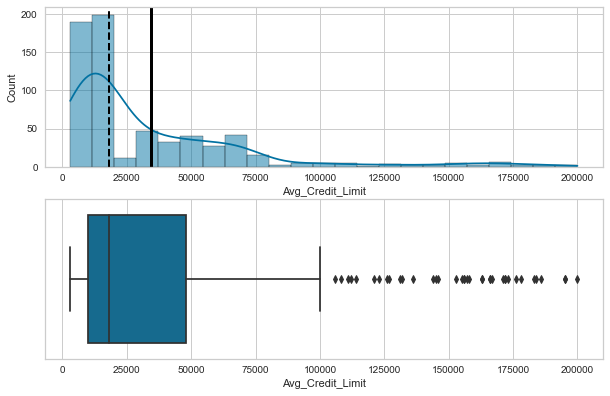

In [34]:
# Average credit limit distribution
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
sns.histplot(x=df.Avg_Credit_Limit,kde=True);
#line for mean
plt.axvline(df["Avg_Credit_Limit"].mean(),color='black',linewidth=3)
#dashed line for median
plt.axvline(df["Avg_Credit_Limit"].median(),color='black',linestyle='dashed',linewidth=2)
plt.subplot(3,1,2)
sns.boxplot(x=df.Avg_Credit_Limit);


Observations
- The average credit limit is highly skewed to the right
- There appars to be a fair amount of outliers with limits above 100K
- As stated previously the average has a minimum of 3K and a max of 200K

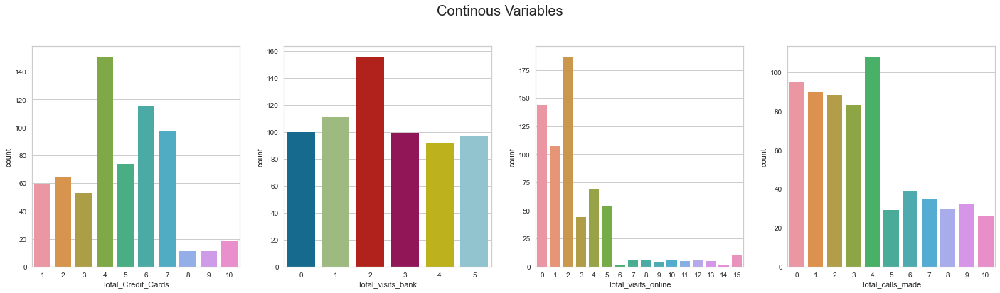

In [35]:
#histogram of continous variables
all_col = df.iloc[:,1:].columns.tolist()
all_cat_col = df.iloc[:,2:].columns.tolist()
fig, axes = plt.subplots(1, 4,  figsize=(20, 6))
fig.suptitle('Continous Variables', fontsize=20)
counter = 0
for ii in range(4):
    sns.countplot(ax=axes[ii],x=df[all_cat_col[counter]])
    counter = counter+1

fig.tight_layout(pad=2.0)

Observations
- Most customers have between 4 to 7 cards
- Most customers visit the bank at least twice
- Most customers have up to 5 online visits
- most customers have called in up to 4 times

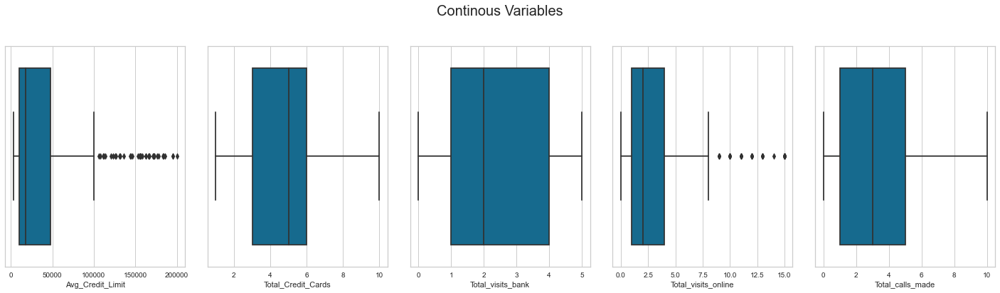

In [36]:
#boxplot of continous variables
fig, axes = plt.subplots(1, 5,  figsize=(20, 6))
fig.suptitle('Continous Variables', fontsize=20)
counter = 0
for ii in range(5):
    sns.boxplot(ax=axes[ii],x=df[all_col[counter]])
    counter = counter+1

fig.tight_layout(pad=2.0)

Observations
- There appears to be many outliers with high credit limits
- Most customers are under 50K, while the max is 100k
- Total online visits appears to have some outliers with some customers using the service up to 15 times

### Bivariate Analysis

<AxesSubplot:>

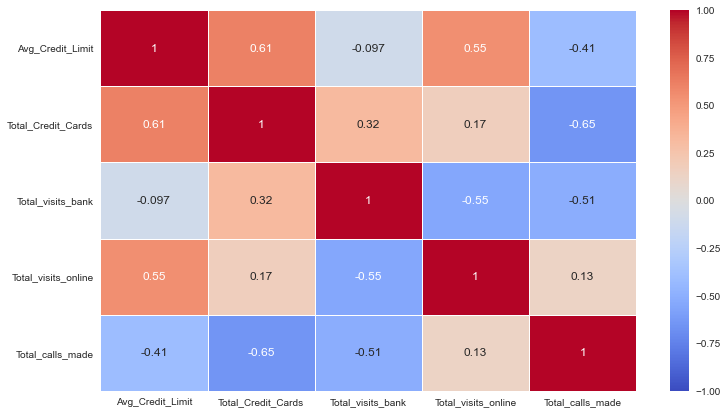

In [37]:
# visualize correlation
plt.figure(figsize=(12, 7))
sns.heatmap(df[all_col].corr(),
            annot=True,cmap="coolwarm",
            linewidths=0.5,vmin=-1,vmax=1,
            center=0,
            cbar=True,)




Observations
- There is strong corrolation between total_credit_cards, avg_credit_limit, and total_visits_online

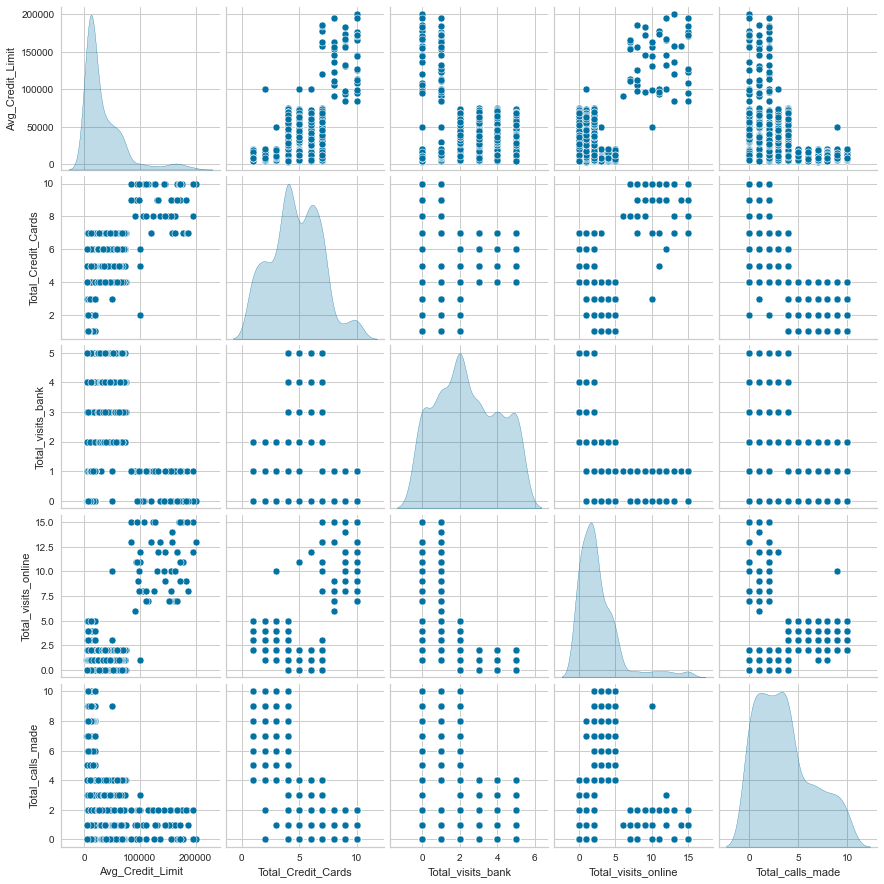

In [38]:
sns.pairplot(df[all_col],diag_kind="kde");

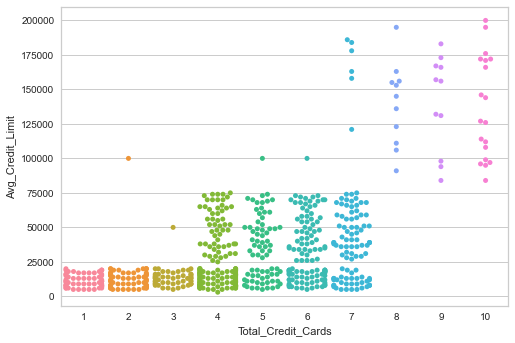

In [39]:
#Avg. credit limit x total cards
sns.swarmplot(x='Total_Credit_Cards',y='Avg_Credit_Limit',data=df);

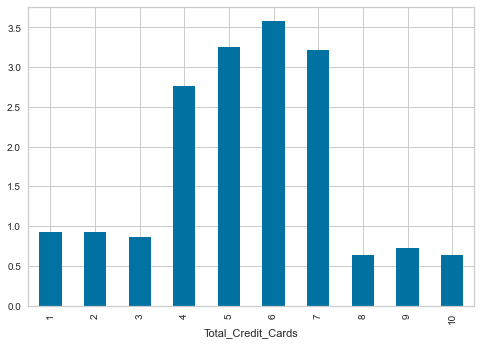

In [40]:
# total bank visits x total cards
df.groupby(["Total_Credit_Cards"])['Total_visits_bank'].mean().plot.bar();

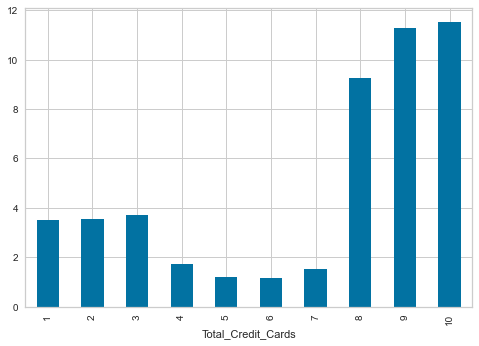

In [41]:
# total online visits x total cards
df.groupby(["Total_Credit_Cards"])['Total_visits_online'].mean().plot.bar();

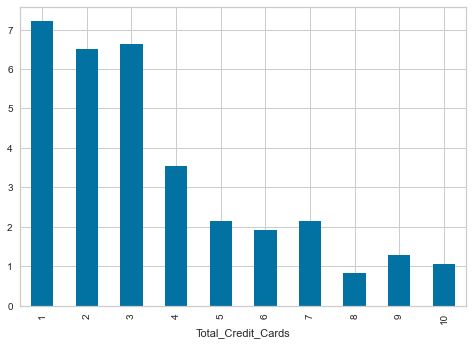

In [42]:
# total calls made x total cards
df.groupby(["Total_Credit_Cards"])['Total_calls_made'].mean().plot.bar();

### Pre-processing

In [43]:
# Check for any null values
df.isnull().sum()

Customer Key           0
Avg_Credit_Limit       0
Total_Credit_Cards     0
Total_visits_bank      0
Total_visits_online    0
Total_calls_made       0
dtype: int64

In [44]:
df.head()

,Customer Key,Avg_Credit_Limit,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made
0,87073,100000,2,1,1,0
1,38414,50000,3,0,10,9
2,17341,50000,7,1,3,4
3,40496,30000,5,1,1,4
4,47437,100000,6,0,12,3


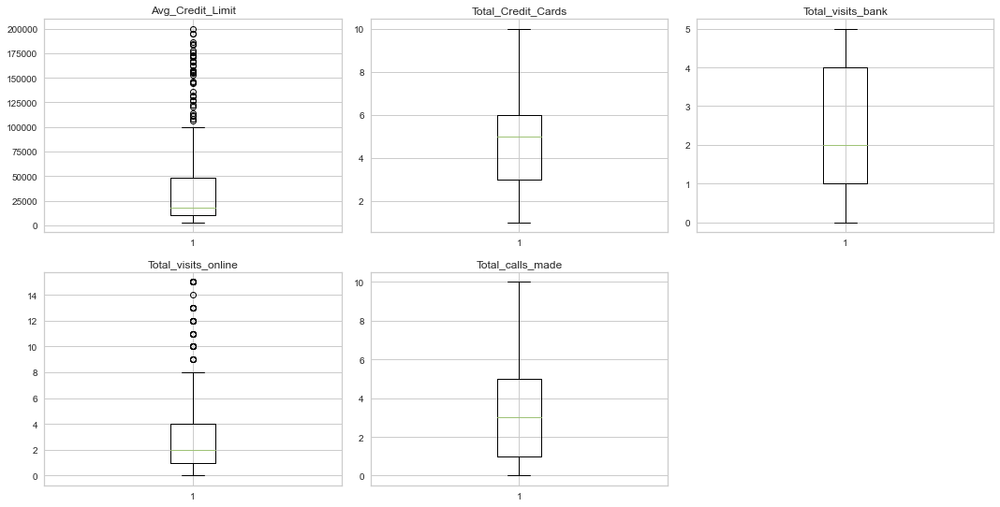

In [45]:
# Check to see if there are any outliers in our continuous variables
continuous_vars=['Avg_Credit_Limit','Total_Credit_Cards', 'Total_visits_bank','Total_visits_online', 
                 'Total_calls_made']

plt.figure(figsize=(15,15))

for i, variable in enumerate(continuous_vars):
                     plt.subplot(4,3,i+1)
                     plt.boxplot(df[variable],whis=1.5)
                     plt.tight_layout()
                     plt.title(variable)

plt.show()

In [46]:
def treat_outliers(df,col):
    '''
    treats outliers in a varaible
    col: str, name of the numerical varaible
    df: data frame
    col: name of the column
    '''
    Q1=df[col].quantile(0.25) # 25th quantile
    Q3=df[col].quantile(0.75)  # 75th quantile
    IQR=Q3-Q1
    Lower_Whisker = Q1 - 2.5*IQR 
    Upper_Whisker = Q3 + 2.5*IQR
    df[col] = np.clip(df[col], Lower_Whisker, Upper_Whisker)
    
    return df

In [47]:
def treat_outliers_all(df, col_list):
    '''
    treat outlier in all numerical varaibles
    col_list: list of numerical varaibles
    df: data frame
    '''
    for c in col_list:
        df = treat_outliers(df,c)
        
    return df

In [48]:
df = treat_outliers_all(df,continuous_vars)

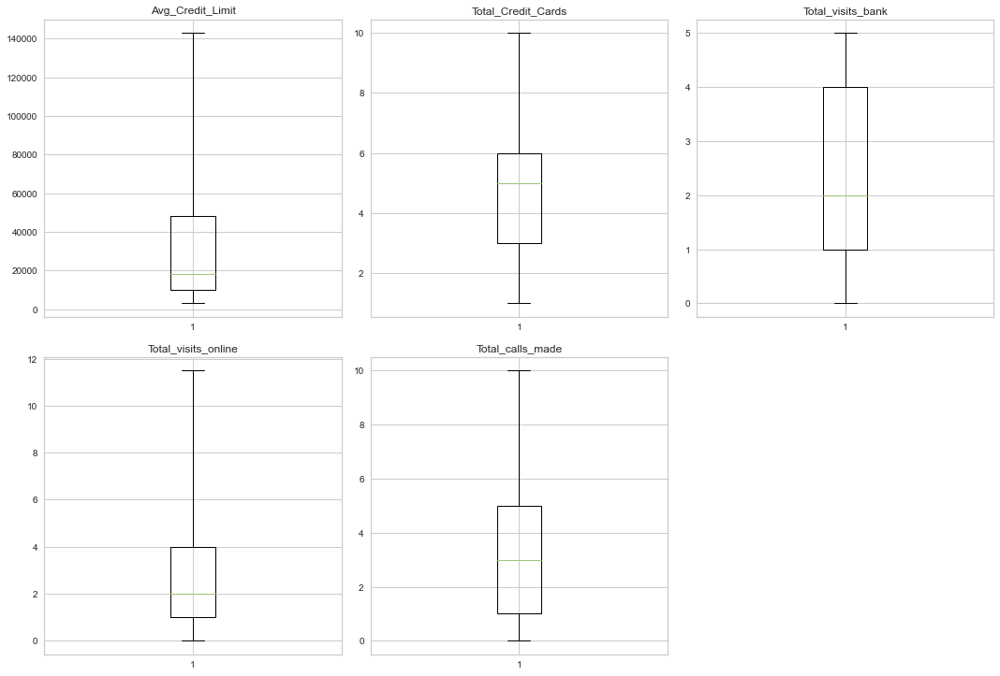

In [49]:
plt.figure(figsize=(15,15))

for i, variable in enumerate(continuous_vars):
                     plt.subplot(3,3,i+1)
                     plt.boxplot(df[variable],whis=2.5)
                     plt.tight_layout()
                     plt.title(variable)

plt.show()

### Scaling Data

In [50]:
#scaling the data set before clustering
scaler=StandardScaler()
subset=df[all_col].copy()
subset_scaled=scaler.fit_transform(subset)

In [51]:
#create a df from the scaled data above
subset_scaled_df=pd.DataFrame(subset_scaled,columns=subset.columns)

### K-Means

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

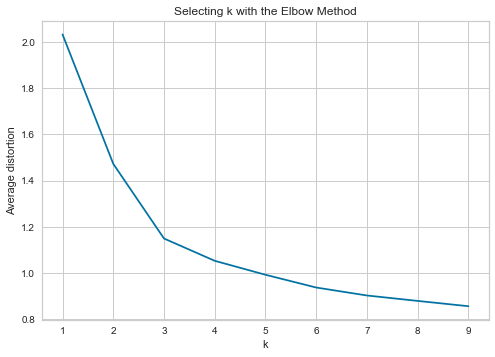

In [52]:
clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(subset_scaled_df)
    prediction=model.predict(subset_scaled_df)
    meanDistortions.append(sum(np.min(cdist(subset_scaled_df, model.cluster_centers_, 'euclidean'), axis=1)) / subset_scaled_df.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

Elbow method shows that 3 should be a good fit for K

### Silhouette Score

In [53]:
sil_score = []
cluster_list = list(range(2,10))
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict((subset_scaled_df))
    #centers = clusterer.cluster_centers_
    score = silhouette_score(subset_scaled_df, preds)
    sil_score.append(score)
    print("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.41850367074625333)
For n_clusters = 3, silhouette score is 0.5178416868882717)
For n_clusters = 4, silhouette score is 0.35594378475440996)
For n_clusters = 5, silhouette score is 0.3420170102568972)
For n_clusters = 6, silhouette score is 0.26373440036647094)
For n_clusters = 7, silhouette score is 0.25806345676412246)
For n_clusters = 8, silhouette score is 0.24321266103833317)
For n_clusters = 9, silhouette score is 0.24539851268971885)


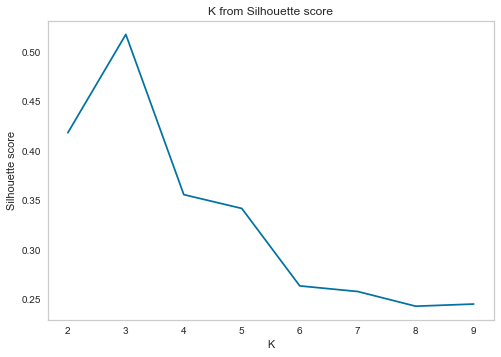

In [54]:
plt.plot(cluster_list,sil_score)
plt.grid()
plt.xlabel('K')
plt.ylabel('Silhouette score')
plt.title('K from Silhouette score');

Just like on the elbow method 3 appears to be a good fit for K

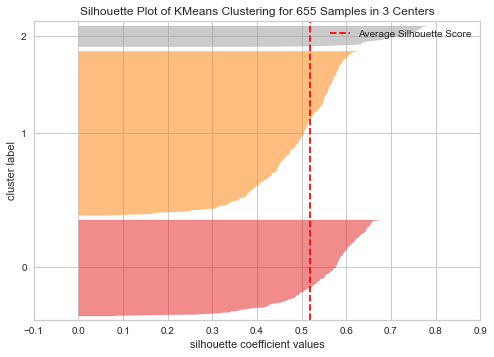

In [55]:
from yellowbrick.cluster import SilhouetteVisualizer
#Discover optimal number of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(3, random_state = 1))
visualizer.fit(subset_scaled_df)    
visualizer.show();

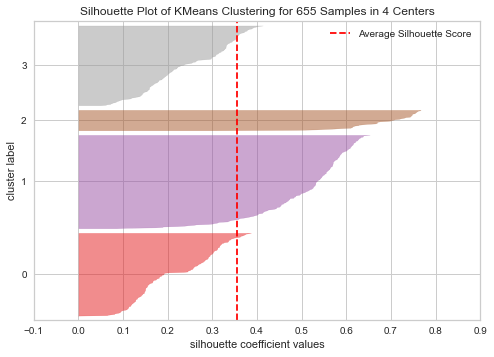

In [56]:
#Discover optimal number of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(4, random_state = 1))
visualizer.fit(subset_scaled_df)    
visualizer.show();

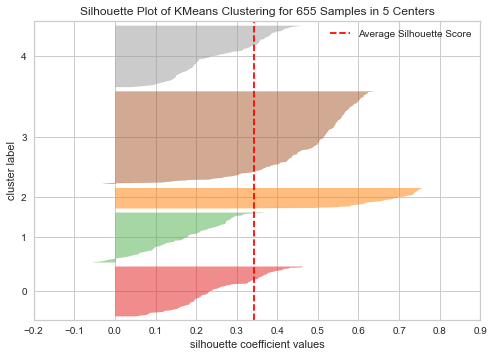

In [57]:
#Discover optimal number of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(5, random_state = 1))
visualizer.fit(subset_scaled_df)    
visualizer.show();

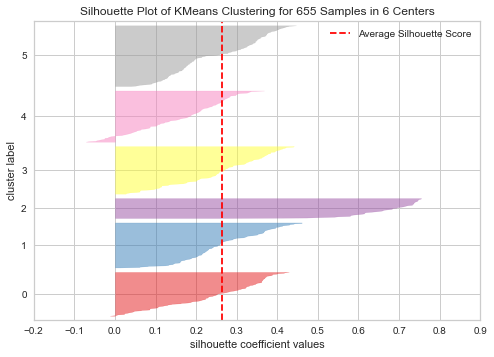

In [58]:
#Discover optimal number of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(6, random_state = 1))
visualizer.fit(subset_scaled_df)    
visualizer.show();

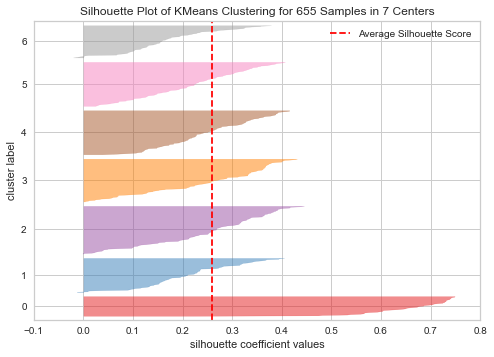

In [59]:
#Discover optimal number of clusters with silhouette coefficients
visualizer = SilhouetteVisualizer(KMeans(7, random_state = 1))
visualizer.fit(subset_scaled_df)    
visualizer.show();

In [60]:
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(subset_scaled_df)

KMeans(n_clusters=3, random_state=0)

In [62]:
df['K_means_segments'] = kmeans.labels_
subset_scaled_df['K_means_segments'] = kmeans.labels_

In [64]:
cluster_profile = df.iloc[:,1:].groupby('K_means_segments').mean()

In [65]:
cluster_profile['count_in_each_segment'] = df.groupby('K_means_segments')['Total_Credit_Cards'].count().values

In [68]:
cluster_profile.style.highlight_max(axis = 0)

,Avg_Credit_Limit,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made,count_in_each_segment
K_means_segments,,,,,,
0,33604.712042,5.505236,3.494764,0.976440,2.005236,382
1,12174.107143,2.410714,0.933036,3.553571,6.870536,224
2,126591.836735,8.775510,0.591837,10.000000,1.102041,49


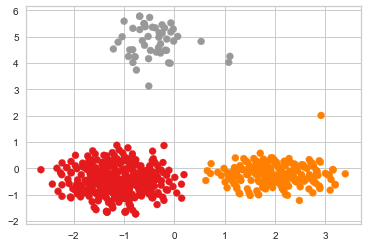

In [71]:
pca=PCA(n_components=3).fit(subset_scaled_df)
pca_2d=pca.transform(subset_scaled_df)
pl.figure("k-means with 3 clusters")
pl.scatter(pca_2d[:,0],pca_2d[:,1],c=kmeans.labels_,cmap='Set1')
pl.show();

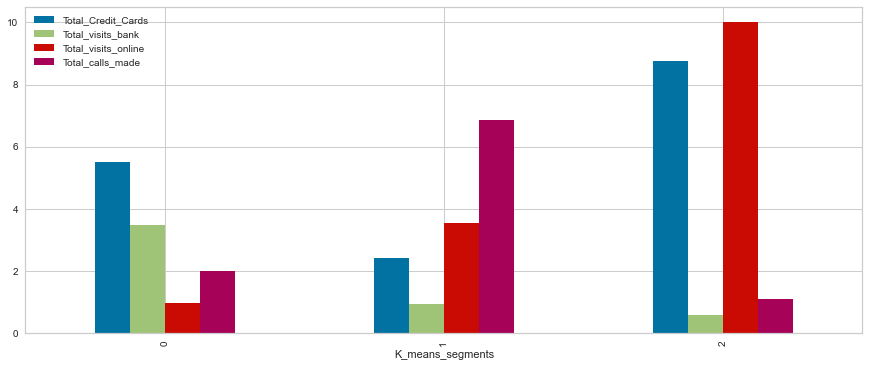

In [73]:
df.iloc[:,2:].groupby('K_means_segments').mean().plot.bar(figsize=(15,6));

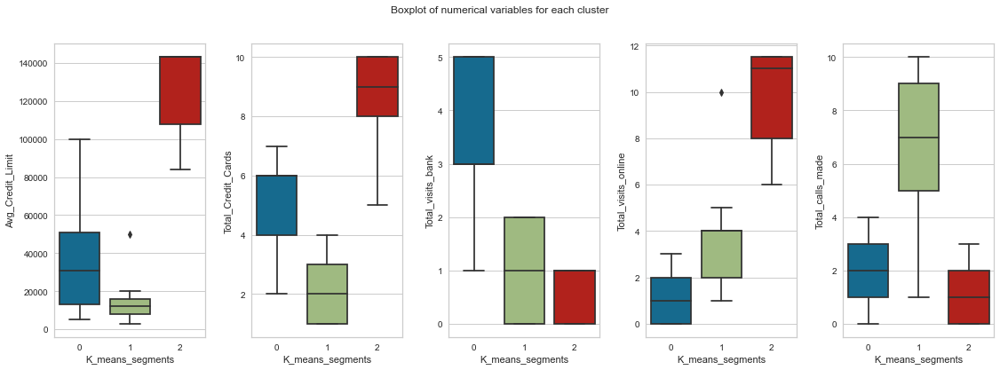

In [74]:
fig, axes = plt.subplots(1, 5,  figsize=(16, 6))
fig.suptitle('Boxplot of numerical variables for each cluster')
counter = 0
for ii in range(5):
    sns.boxplot(ax=axes[ii],y=df[all_col[counter]],x=df['K_means_segments'])
    counter = counter+1

fig.tight_layout(pad=2.0)

In [76]:
pd.crosstab(df.K_means_segments, df.Total_Credit_Cards).style.highlight_max(axis = 0)

Total_Credit_Cards,1,2,3,4,5,6,7,8,9,10
K_means_segments,,,,,,,,,,
0,0,1,0,102,73,114,92,0,0,0
1,59,63,53,49,0,0,0,0,0,0
2,0,0,0,0,1,1,6,11,11,19


In [78]:
pd.crosstab(df.K_means_segments, df.Total_visits_bank).style.highlight_max(axis = 0)

Total_visits_bank,0,1,2,3,4,5
K_means_segments,,,,,,
0,0,3,91,99,92,97
1,80,79,65,0,0,0
2,20,29,0,0,0,0


In [79]:
pd.crosstab(df.K_means_segments, df.Total_visits_online).style.highlight_max(axis = 0)

Total_visits_online,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,11.5
K_means_segments,,,,,,,,,,,,,
0,144,104,133,1,0,0,0,0,0,0,0,0,0
1,0,3,54,43,69,54,0,0,0,0,1,0,0
2,0,0,0,0,0,0,1,6,6,4,5,5,22


In [80]:
pd.crosstab(df.K_means_segments, df.Total_calls_made).style.highlight_max(axis = 0)

Total_calls_made,0,1,2,3,4,5,6,7,8,9,10
K_means_segments,,,,,,,,,,,
0,80,74,69,82,77,0,0,0,0,0,0
1,0,1,1,0,31,29,39,35,30,32,26
2,15,15,18,1,0,0,0,0,0,0,0


In [81]:
#insights

In [82]:
### Hierarchial Clustering

In [83]:
subset_scaled_df2 = subset_scaled_df.drop('K_means_segments',axis=1).copy()
df=df.drop('K_means_segments',axis=1).copy()

In [85]:
# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock"]

# list of linkage methods
linkage_methods = ["single", "complete", "average", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(subset_scaled_df2, metric=dm, method=lm)
        c, coph_dists = cophenet(Z, pdist(subset_scaled_df2))
        print(
            "Cophenetic correlation for {} distance and {} linkage is {}.".format(
                dm.capitalize(), lm, c
            )
        )
        if high_cophenet_corr < c:
            high_cophenet_corr = c
            high_dm_lm[0] = dm
            high_dm_lm[1] = lm

Cophenetic correlation for Euclidean distance and single linkage is 0.7275414718083186.
Cophenetic correlation for Euclidean distance and complete linkage is 0.8659049817993769.
Cophenetic correlation for Euclidean distance and average linkage is 0.9030997984572706.
Cophenetic correlation for Euclidean distance and weighted linkage is 0.8203551626714767.
Cophenetic correlation for Chebyshev distance and single linkage is 0.7358291511513884.
Cophenetic correlation for Chebyshev distance and complete linkage is 0.8020247924899484.
Cophenetic correlation for Chebyshev distance and average linkage is 0.9024792017764152.
Cophenetic correlation for Chebyshev distance and weighted linkage is 0.8882438796143326.
Cophenetic correlation for Mahalanobis distance and single linkage is 0.6988657865019627.
Cophenetic correlation for Mahalanobis distance and complete linkage is 0.26657942499872644.
Cophenetic correlation for Mahalanobis distance and average linkage is 0.8247541471245173.
Cophenetic c

In [86]:
# printing the combination of distance metric and linkage method with the highest cophenetic correlation
print(
    "Highest cophenetic correlation is {}, which is obtained with {} distance and {} linkage.".format(
        high_cophenet_corr, high_dm_lm[0].capitalize(), high_dm_lm[1]
    )
)

Highest cophenetic correlation is 0.9030997984572706, which is obtained with Euclidean distance and average linkage.


In [87]:
### Different linkage methods only using Euclidean distance

In [88]:
# list of linkage methods
linkage_methods = ["single", "complete", "average", "centroid", "ward", "weighted"]

high_cophenet_corr = 0
high_dm_lm = [0, 0]

for lm in linkage_methods:
    Z = linkage(subset_scaled_df2, metric="euclidean", method=lm)
    c, coph_dists = cophenet(Z, pdist(subset_scaled_df))
    print("Cophenetic correlation for {} linkage is {}.".format(lm, c))
    if high_cophenet_corr < c:
        high_cophenet_corr = c
        high_dm_lm[0] = "euclidean"
        high_dm_lm[1] = lm

Cophenetic correlation for single linkage is 0.7358999538599963.
Cophenetic correlation for complete linkage is 0.88493451511064.
Cophenetic correlation for average linkage is 0.9211235450353684.
Cophenetic correlation for centroid linkage is 0.918334279115958.
Cophenetic correlation for ward linkage is 0.7726422099314925.
Cophenetic correlation for weighted linkage is 0.8311754227912987.


In [89]:
print(
    'Highest cophenet correlation is {}, which is obtinaed with {} distance metric and {} linkage method'.format(
        high_cophenet_corr ,high_dm_lm[0],high_dm_lm[1]
    )
)

Highest cophenet correlation is 0.9211235450353684, which is obtinaed with euclidean distance metric and average linkage method


In [90]:
#Observations
#- we can see that cophenet index is maximum with euclidean distance metric which euclidean distance method and average linkage method. Lets see the dendrogram of different linkage method

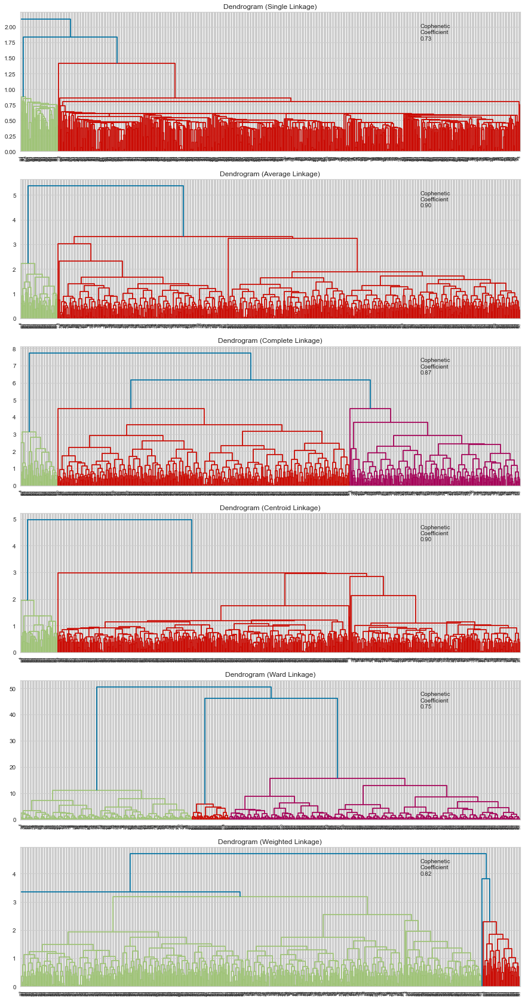

In [91]:
# List of all linkage methods to check
methods = ['single',
           'average', 
           'complete',
           'centroid',
           'ward',
          'weighted']

# Create lists to save results of coph calculation
compare_cols = ['Linkage', 'Cophenetic Coefficient']
compare = []

# Create a subplot image
fig, axs = plt.subplots(len(methods), 1, figsize=(15, 30))

# Enumerate through the list of all methods above
# Get linkage, plot dendrogram, calculate cophenetic coefficient
for i, method in enumerate(methods):
    
    Z = linkage(subset_scaled_df2, metric='euclidean', method=method)

    dendrogram(Z, ax=axs[i]);
    axs[i].set_title(f'Dendrogram ({method.capitalize()} Linkage)')
    coph_corr, coph_dist = cophenet(Z, pdist(subset_scaled_df2))
    axs[i].annotate(f'Cophenetic\nCoefficient\n{coph_corr:0.2f}', 
                    (0.80, 0.80),
                    xycoords='axes fraction')
    compare.append([method, coph_corr])

In [92]:
#Compare Cophenetic Coefficient for each linkage
df_cc = pd.DataFrame(compare, columns=compare_cols)
df_cc

,Linkage,Cophenetic Coefficient
0,single,0.727541
1,average,0.903100
2,complete,0.865905
3,centroid,0.899271
4,ward,0.753491
5,weighted,0.820355


In [93]:
# Dendrogram of Mahalanobis, Cityblock and Chebyshev

In [94]:
distance_metrics = [ 'mahalanobis','cityblock','chebyshev']
linkage_methods = ['average', 'weighted']

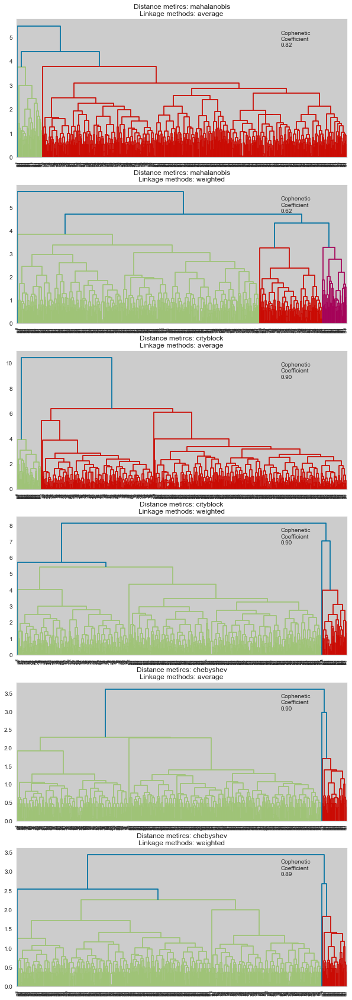

In [95]:
fig, axs = plt.subplots(len(distance_metrics)+len(distance_metrics), 1, figsize=(10, 30))
i=0
for dm in distance_metrics:
    for lm in linkage_methods:
        Z = linkage(subset_scaled_df2, metric=dm, method=lm)
        dendrogram(Z,  ax=axs[i]);
        axs[i].set_title('Distance metircs: {}\nLinkage methods: {}'.format(dm,lm))
        coph_corr, coph_dist = cophenet(Z, pdist(subset_scaled_df2))
        axs[i].annotate(f'Cophenetic\nCoefficient\n{coph_corr:0.2f}', 
                        (0.80, 0.80),
                        xycoords='axes fraction')
        axs[i].set_title('Distance metircs: {}\nLinkage methods: {}'.format(dm,lm))                        
        i +=1

In [96]:
#create 3 clusters
HCmodel = AgglomerativeClustering(n_clusters=3,affinity='euclidean', linkage='single')
HCmodel.fit(subset_scaled_df2)
subset_scaled_df2['HC_Clusters'] = HCmodel.labels_
df['HC_Clusters'] = HCmodel.labels_
cluster_profile1 = df.iloc[:,1:].groupby('HC_Clusters').mean()
cluster_profile1['count_in_each_segments'] = df.groupby('HC_Clusters')['Total_Credit_Cards'].count().values

In [97]:
cluster_profile1.style.highlight_max(axis = 0)

,Avg_Credit_Limit,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made,count_in_each_segments
HC_Clusters,,,,,,
0,25642.975207,4.363636,2.552066,1.915702,3.795041,605
1,50000.000000,3.000000,0.000000,10.000000,9.000000,1
2,126591.836735,8.775510,0.591837,10.000000,1.102041,49


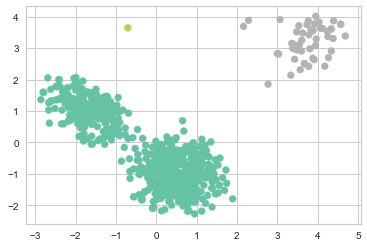

In [98]:
pca=PCA(n_components=3).fit(subset_scaled_df2)
pca_2d=pca.transform(subset_scaled_df2)
pl.figure("HCmodels with 3 clusters")
pl.scatter(pca_2d[:,0],pca_2d[:,1],c=HCmodel.labels_,cmap='Set2')
pl.show();

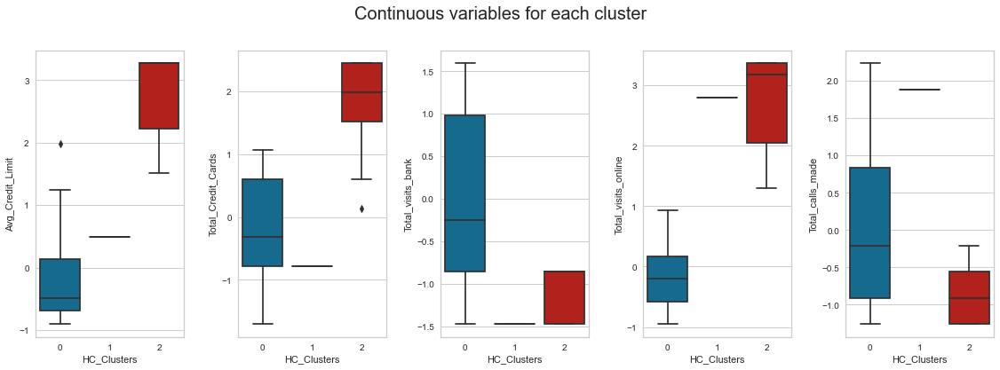

In [99]:
fig, axes = plt.subplots(1, 5,  figsize=(16, 6))
fig.suptitle('Continuous variables for each cluster', fontsize=20)
counter = 0
for ii in range(5):
    sns.boxplot(ax=axes[ii],y=subset_scaled_df2[all_col[counter]],x=subset_scaled_df2['HC_Clusters'])
    counter = counter+1

fig.tight_layout(pad=2.0)

In [101]:
df = df.drop('HC_Clusters',axis=1).copy()
subset_scaled_df2 = subset_scaled_df2.drop('HC_Clusters',axis=1).copy()

In [102]:
#Now with 4 clusters
HCmodel = AgglomerativeClustering(n_clusters=4,affinity='euclidean', linkage='ward')
HCmodel.fit(subset_scaled_df2)
subset_scaled_df2['HC_Clusters'] = HCmodel.labels_
df['HC_Clusters'] = HCmodel.labels_
cluster_profile1 = df.iloc[:,1:].groupby('HC_Clusters').mean()
cluster_profile1['count_in_each_segments'] = df.groupby('HC_Clusters')['Total_Credit_Cards'].count().values

In [103]:
cluster_profile1.style.highlight_max(axis = 0)

,Avg_Credit_Limit,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made,count_in_each_segments
HC_Clusters,,,,,,
0,19995.918367,5.518367,3.673469,1.053061,1.979592,245
1,12151.111111,2.422222,0.937778,3.546667,6.857778,225
2,126591.836735,8.775510,0.591837,10.000000,1.102041,49
3,58316.176471,5.485294,3.183824,0.830882,2.036765,136


- With 4 clusters there is overlap from 0 to 3 clusters. 3 clusters would be best.

In [105]:
df = df.drop('HC_Clusters',axis=1).copy()
subset_scaled_df2 = subset_scaled_df2.drop('HC_Clusters',axis=1).copy()

In [106]:
#Now we can try with 3 clusters
HCmodel = AgglomerativeClustering(n_clusters=3,affinity='euclidean', linkage='ward')
HCmodel.fit(subset_scaled_df2)
subset_scaled_df2['HC_Clusters'] = HCmodel.labels_

In [107]:
df['HC_Clusters'] = HCmodel.labels_


In [108]:
cluster_profile = df.iloc[:,1:].groupby('HC_Clusters').mean()


In [109]:
cluster_profile['count_in_each_segments'] = df.groupby('HC_Clusters')['Total_Credit_Cards'].count().values


In [110]:
cluster_profile.style.highlight_max(axis = 0)

,Avg_Credit_Limit,Total_Credit_Cards,Total_visits_bank,Total_visits_online,Total_calls_made,count_in_each_segments
HC_Clusters,,,,,,
0,33674.540682,5.506562,3.498688,0.973753,2.000000,381
1,12151.111111,2.422222,0.937778,3.546667,6.857778,225
2,126591.836735,8.775510,0.591837,10.000000,1.102041,49


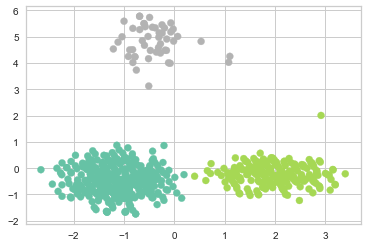

In [111]:
pca=PCA(n_components=3).fit(subset_scaled_df2)
pca_2d=pca.transform(subset_scaled_df2)
pl.figure("HCmodels with 3 clusters")
pl.scatter(pca_2d[:,0],pca_2d[:,1],c=HCmodel.labels_,cmap='Set2')
pl.show();

- With 3 separate cluster we get a simmilar result to K-Means

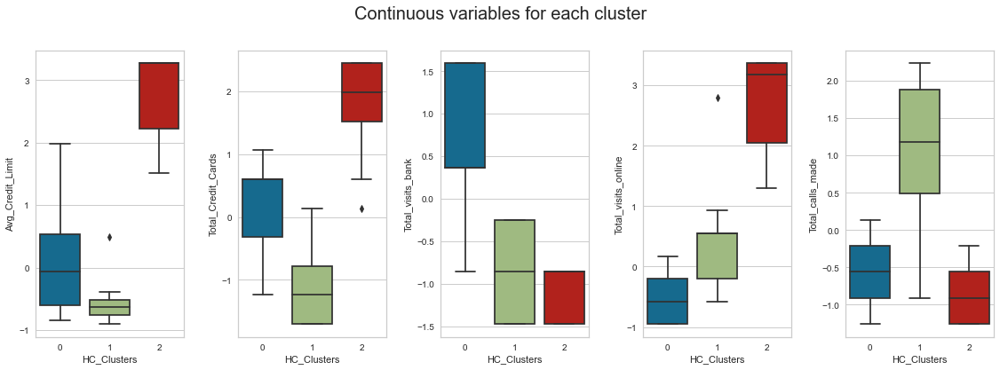

In [113]:
fig, axes = plt.subplots(1, 5,  figsize=(16, 6))
fig.suptitle('Continuous variables for each cluster', fontsize=20)
counter = 0
for ii in range(5):
    sns.boxplot(ax=axes[ii],y=subset_scaled_df2[all_col[counter]],x=subset_scaled_df2['HC_Clusters'])
    counter = counter+1

fig.tight_layout(pad=2.0)

In [114]:
pd.crosstab(df['HC_Clusters'], df.Total_Credit_Cards).style.highlight_max(axis = 0)

Total_Credit_Cards,1,2,3,4,5,6,7,8,9,10
HC_Clusters,,,,,,,,,,
0,0,1,0,102,72,114,92,0,0,0
1,59,63,53,49,1,0,0,0,0,0
2,0,0,0,0,1,1,6,11,11,19


- customers in cluster 0 with 4-7 Credit cards
- customers in cluster 1 with 1-3 creditcards
- customers in cluster 2 with 8-10 creditcards.

### K-Means compared to Hierarchical

- K-Means and Hierarchical Clustering- Ward Linkage Methods have similar results.

- Hierarchical Clustering – Single Linkage method gives different set of clusters with different averages and different grouping. The variance in one group is extremely high and there is no uniform distribution and there seems to be an overlap in total visits online from cluster 1 and 2.

- k-means algorithms assume that clusters are spherical in shapes but that is not the assumption of HC algorithm.

- With K-Means clustering, both Elbow method and Silhouette score confirmed that k value=3 is apt.

- Hierarchical clustering showed some overlap with 4 clusters therefor 3 cluster was our target

### Business Recommendations

#### Cluster 1
- These customers have a low average on cards with the bank. The bank should target this group to expand their car portfolio. This cluster should be your target demographic 

#### Cluster 2
- These customers have a high average of cards, and credit limits. It would probably be in the banks intrest to not waste resources on these customers as they are unlikely to add more cards on their account

#### Cluster 0
- These customers are in the middle. They have more cards then the customers in cluster 1, but less then cluster 2. There could be opportunity here, but not nearly as much as with cluster 1.